In [157]:
import pandas as pd

In [158]:
df=pd.read_csv("/content/data.csv")

In [159]:
df

,Reviewer Name,Review Title,Place of Review,Up Votes,Down Votes,Month,Review text,Ratings
0,Kamal Suresh,Nice product,"Certified Buyer, Chirakkal",889.0,64.0,Feb 2021,"Nice product, good quality, but price is now r...",4
1,Flipkart Customer,Don't waste your money,"Certified Buyer, Hyderabad",109.0,6.0,Feb 2021,They didn't supplied Yonex Mavis 350. Outside ...,1
2,A. S. Raja Srinivasan,Did not meet expectations,"Certified Buyer, Dharmapuri",42.0,3.0,Apr 2021,Worst product. Damaged shuttlecocks packed in ...,1
3,Suresh Narayanasamy,Fair,"Certified Buyer, Chennai",25.0,1.0,NaN,"Quite O. K. , but nowadays the quality of the...",3
4,ASHIK P A,Over priced,NaN,147.0,24.0,Apr 2016,Over pricedJust â?¹620 ..from retailer.I didn'...,1
...,...,...,...,...,...,...,...,...
8513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
8514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
8515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
8516,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [160]:
df.head()

,Reviewer Name,Review Title,Place of Review,Up Votes,Down Votes,Month,Review text,Ratings
0,Kamal Suresh,Nice product,"Certified Buyer, Chirakkal",889.0,64.0,Feb 2021,"Nice product, good quality, but price is now r...",4
1,Flipkart Customer,Don't waste your money,"Certified Buyer, Hyderabad",109.0,6.0,Feb 2021,They didn't supplied Yonex Mavis 350. Outside ...,1
2,A. S. Raja Srinivasan,Did not meet expectations,"Certified Buyer, Dharmapuri",42.0,3.0,Apr 2021,Worst product. Damaged shuttlecocks packed in ...,1
3,Suresh Narayanasamy,Fair,"Certified Buyer, Chennai",25.0,1.0,NaN,"Quite O. K. , but nowadays the quality of the...",3
4,ASHIK P A,Over priced,NaN,147.0,24.0,Apr 2016,Over pricedJust â?¹620 ..from retailer.I didn'...,1


In [161]:
df.shape

(8518, 8)

In [162]:
df.columns


Index(['Reviewer Name', 'Review Title', 'Place of Review', 'Up Votes',
       'Down Votes', 'Month', 'Review text', 'Ratings'],
      dtype='object')

In [163]:
df.loc[0, 'Review text']

'Nice product, good quality, but price is now rising which is a bad sign. 800-850 was an affordable price, especially when we play everyday. So kindly help us out in terms of the price. Thank You.READ MORE'

In [164]:
df["Review Title"]

0                    Nice product
1          Don't waste your money
2       Did not meet expectations
3                            Fair
4                     Over priced
                  ...            
8513                          NaN
8514                          NaN
8515                          NaN
8516                          NaN
8517                          NaN
Name: Review Title, Length: 8518, dtype: object

In [165]:
df.isnull().sum()

Reviewer Name       10
Review Title        10
Place of Review     50
Up Votes            10
Down Votes          10
Month              465
Review text          8
Ratings              0
dtype: int64

In [166]:
data = df[['Review text', 'Ratings']]   # Selecting only the relevant columns

In [167]:
data.columns = ['review_text', 'sentiment']  # Renaming columns for convenience


In [168]:
data

,review_text,sentiment
0,"Nice product, good quality, but price is now r...",4
1,They didn't supplied Yonex Mavis 350. Outside ...,1
2,Worst product. Damaged shuttlecocks packed in ...,1
3,"Quite O. K. , but nowadays the quality of the...",3
4,Over pricedJust â?¹620 ..from retailer.I didn'...,1
...,...,...
8513,NaN,5
8514,NaN,2
8515,NaN,4
8516,NaN,1


In [169]:
data.dtypes

review_text    object
sentiment       int64
dtype: object

In [170]:
data.describe()

,sentiment
count,8518.000000
mean,4.181028
std,1.262200
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


In [171]:
data.dropna(subset=['review_text'], inplace=True)

# Step 3: Reset index (optional)
data.reset_index(drop=True, inplace=True)


In [172]:
data.isnull().sum()

review_text    0
sentiment      0
dtype: int64

In [173]:
data['review_text']

0       Nice product, good quality, but price is now r...
1       They didn't supplied Yonex Mavis 350. Outside ...
2       Worst product. Damaged shuttlecocks packed in ...
3       Quite O. K. , but nowadays  the quality of the...
4       Over pricedJust â?¹620 ..from retailer.I didn'...
                              ...                        
8505    Delivered before time but price is high from m...
8506    up to the mark but same is available in market...
8507                         Nice delivery speedREAD MORE
8508    No complaints about the item . Its the best on...
8509    Not sure why we have charged for this product ...
Name: review_text, Length: 8510, dtype: object

#Data Preparation

In [174]:
data

,review_text,sentiment
0,"Nice product, good quality, but price is now r...",4
1,They didn't supplied Yonex Mavis 350. Outside ...,1
2,Worst product. Damaged shuttlecocks packed in ...,1
3,"Quite O. K. , but nowadays the quality of the...",3
4,Over pricedJust â?¹620 ..from retailer.I didn'...,1
...,...,...
8505,Delivered before time but price is high from m...,3
8506,up to the mark but same is available in market...,4
8507,Nice delivery speedREAD MORE,5
8508,No complaints about the item . Its the best on...,5


In [175]:
data["sentiment"].value_counts(normalize = True)

5    0.596827
4    0.204935
1    0.090012
3    0.072268
2    0.035958
Name: sentiment, dtype: float64

In [176]:
X=data[['review_text']]
y=data[['sentiment']]

In [177]:
# Splitting into train and test

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [178]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6808 entries, 1372 to 7270
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   review_text  6808 non-null   object
dtypes: object(1)
memory usage: 106.4+ KB


In [179]:
print(X_train.head())

                                            review_text
1372                                Very good.READ MORE
3846  Have been purchasing the shuttles from Flipkar...
333                            Nice product. .READ MORE
1259  Worst on recent times.We played new Ball today...
3532                                    BetterREAD MORE


In [180]:
X_train.shape

(6808, 1)

# Text Preprocessing

In [181]:
import nltk

# Download the punctuations
nltk.download('punkt')
# Download the stop words corpus
nltk.download('stopwords')
# Downloading wordnet before applying Lemmatizer
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [182]:
import re
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

In [183]:
stemmer = PorterStemmer()

In [184]:
lemmatizer = WordNetLemmatizer()

In [185]:
def preprocess(raw_text, flag):
    # Removing special characters and digits
    text = re.sub("[^a-zA-Z]", " ", raw_text)

    # change text to lower case
    text = text.lower()

    # tokenize into words
    words = word_tokenize(text)

    # remove stop words
    words = [word for word in words if word not in stopwords.words("english")]

    # Stemming/Lemmatization
    if(flag == 'stem'):
        words = [stemmer.stem(word) for word in words]
    else:
        words = [lemmatizer.lemmatize(word) for word in words]

    preprocessed_text = " ".join(words)
    words_in_preprocessed_text = len(words)

    return pd.Series([preprocessed_text, words_in_preprocessed_text])

In [186]:
temp_df=X_train['review_text'].apply(lambda x: preprocess(x, 'stem'))
temp_df

,0,1
1372,good read,2
3846,purchas shuttl flipkart long time qualiti shut...,16
333,nice product read,3
1259,worst recent time play new ball today two ball...,39
3532,betterread,1
...,...,...
5734,genuin orgin productread,3
5191,badminton shuttl goodread,3
5390,best qualiti shuttl read,4
860,nice happyread,2


In [187]:
from tqdm import tqdm, tqdm_notebook

In [188]:
tqdm.pandas()

In [189]:
temp_df = X_train['review_text'].progress_apply(lambda x: preprocess(x, 'stem'))

temp_df.head()

100%|██████████| 6808/6808 [00:05<00:00, 1146.55it/s]


,0,1
1372,good read,2
3846,purchas shuttl flipkart long time qualiti shut...,16
333,nice product read,3
1259,worst recent time play new ball today two ball...,39
3532,betterread,1


In [190]:
temp_df.columns = ['clean_text_stem', 'text_length_stem']

temp_df.head()

,clean_text_stem,text_length_stem
1372,good read,2
3846,purchas shuttl flipkart long time qualiti shut...,16
333,nice product read,3
1259,worst recent time play new ball today two ball...,39
3532,betterread,1


In [191]:
X_train = pd.concat([X_train, temp_df], axis=1)

X_train.head()

,review_text,clean_text_stem,text_length_stem
1372,Very good.READ MORE,good read,2
3846,Have been purchasing the shuttles from Flipkar...,purchas shuttl flipkart long time qualiti shut...,16
333,Nice product. .READ MORE,nice product read,3
1259,Worst on recent times.We played new Ball today...,worst recent time play new ball today two ball...,39
3532,BetterREAD MORE,betterread,1


In [192]:
temp_df = X_train['review_text'].progress_apply(lambda x: preprocess(x, 'lemma'))

temp_df.head()

100%|██████████| 6808/6808 [00:05<00:00, 1317.01it/s]


,0,1
1372,good read,2
3846,purchasing shuttle flipkart long time quality ...,16
333,nice product read,3
1259,worst recent time played new ball today two ba...,39
3532,betterread,1


In [193]:
temp_df.columns = ['clean_text_lemma', 'text_length_lemma']

temp_df.head()

,clean_text_lemma,text_length_lemma
1372,good read,2
3846,purchasing shuttle flipkart long time quality ...,16
333,nice product read,3
1259,worst recent time played new ball today two ba...,39
3532,betterread,1


In [194]:
X_train = pd.concat([X_train, temp_df], axis=1)

X_train.head()

,review_text,clean_text_stem,text_length_stem,clean_text_lemma,text_length_lemma
1372,Very good.READ MORE,good read,2,good read,2
3846,Have been purchasing the shuttles from Flipkar...,purchas shuttl flipkart long time qualiti shut...,16,purchasing shuttle flipkart long time quality ...,16
333,Nice product. .READ MORE,nice product read,3,nice product read,3
1259,Worst on recent times.We played new Ball today...,worst recent time play new ball today two ball...,39,worst recent time played new ball today two ba...,39
3532,BetterREAD MORE,betterread,1,betterread,1


In [195]:
X_train.head()

,review_text,clean_text_stem,text_length_stem,clean_text_lemma,text_length_lemma
1372,Very good.READ MORE,good read,2,good read,2
3846,Have been purchasing the shuttles from Flipkar...,purchas shuttl flipkart long time qualiti shut...,16,purchasing shuttle flipkart long time quality ...,16
333,Nice product. .READ MORE,nice product read,3,nice product read,3
1259,Worst on recent times.We played new Ball today...,worst recent time play new ball today two ball...,39,worst recent time played new ball today two ba...,39
3532,BetterREAD MORE,betterread,1,betterread,1


Creating Word Cloud

In [196]:
from wordcloud import WordCloud

In [197]:
y_train

,sentiment
1372,5
3846,2
333,5
1259,1
3532,5
...,...
5734,5
5191,5
5390,5
860,5


In [198]:
y_train_df = pd.DataFrame(y_train, columns=['sentiment'])
y_train_df

,sentiment
1372,5
3846,2
333,5
1259,1
3532,5
...,...
5734,5
5191,5
5390,5
860,5


In [199]:
positive_indices = y_train_df[(y_train_df['sentiment'] == 5) | (y_train_df['sentiment'] == 4)].index
positive_df = X_train.loc[positive_indices]


In [200]:
positive_df

,review_text,clean_text_stem,text_length_stem,clean_text_lemma,text_length_lemma
1372,Very good.READ MORE,good read,2,good read,2
333,Nice product. .READ MORE,nice product read,3,nice product read,3
3532,BetterREAD MORE,betterread,1,betterread,1
5707,goodREAD MORE,goodread,1,goodread,1
1024,GoodREAD MORE,goodread,1,goodread,1
...,...,...,...,...,...
6265,nice product...... Thankyou.READ MORE,nice product thankyou read,4,nice product thankyou read,4
5734,genuine & orginal productREAD MORE,genuin orgin productread,3,genuine orginal productread,3
5191,Badminton shuttle is too goodREAD MORE,badminton shuttl goodread,3,badminton shuttle goodread,3
5390,best quality shuttle 🖤READ MORE,best qualiti shuttl read,4,best quality shuttle read,4


In [201]:
words = ' '.join(positive_df['clean_text_lemma'])

print(words[:100])

good read nice product read betterread goodread goodread best budget read superread product expected


In [202]:
cleaned_word = " ".join([word for word in words.split()
                        if 'subject' not in word])

In [203]:
positive_wordcloud = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(cleaned_word)

In [204]:
import matplotlib.pyplot as plt


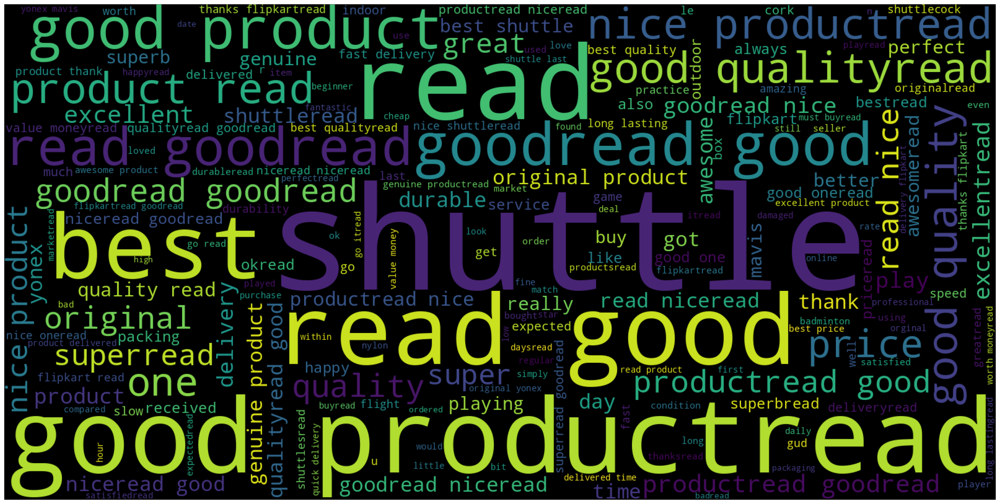

In [205]:
plt.figure(1,figsize=(30,20))
plt.imshow(positive_wordcloud)
plt.axis('off')
plt.show()

In [206]:
negative_indices = y_train_df[(y_train_df['sentiment'] == 1) | (y_train_df['sentiment'] == 2)].index
negative_df = X_train.loc[negative_indices]

In [207]:
negative_df

,review_text,clean_text_stem,text_length_stem,clean_text_lemma,text_length_lemma
3846,Have been purchasing the shuttles from Flipkar...,purchas shuttl flipkart long time qualiti shut...,16,purchasing shuttle flipkart long time quality ...,16
1259,Worst on recent times.We played new Ball today...,worst recent time play new ball today two ball...,39,worst recent time played new ball today two ba...,39
3098,It's really disappointing 😞 . 1 shuttle lasts ...,realli disappoint shuttl last hard practic mat...,12,really disappointing shuttle last hard practic...,12
351,Easily got damagedREAD MORE,easili got damagedread,3,easily got damagedread,3
7382,Looks not genuineREAD MORE,look genuineread,2,look genuineread,2
...,...,...,...,...,...
995,D grade product. 🤮READ MORE,grade product read,3,grade product read,3
161,Very bad product I ever receivedREAD MORE,bad product ever receivedread,4,bad product ever receivedread,4
3556,This shuttle is break very fast It is not bett...,shuttl break fast better mavi iread,6,shuttle break fast better mavis iread,6
1267,Not as good as per it's priceREAD MORE,good per priceread,3,good per priceread,3


In [208]:
words = ' '.join(negative_df['clean_text_lemma'])

cleaned_word = " ".join([word for word in words.split()
                        if 'subject' not in word])

In [209]:
neg_wordcloud = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(cleaned_word)

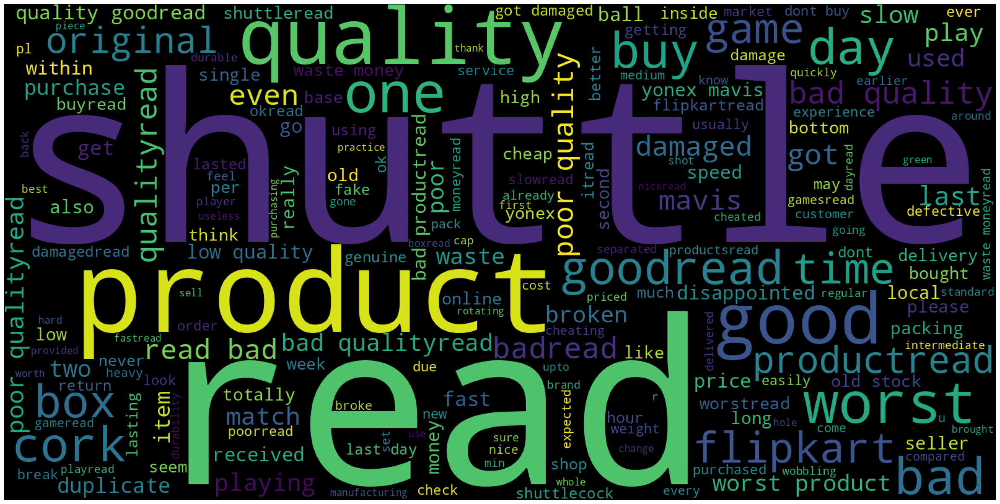

In [210]:
plt.figure(1,figsize=(30,20))
plt.imshow(neg_wordcloud)
plt.axis('off')
plt.show()

Converting Text to Numerical vectors - BOW Representation

In [211]:
X_train.head()

,review_text,clean_text_stem,text_length_stem,clean_text_lemma,text_length_lemma
1372,Very good.READ MORE,good read,2,good read,2
3846,Have been purchasing the shuttles from Flipkar...,purchas shuttl flipkart long time qualiti shut...,16,purchasing shuttle flipkart long time quality ...,16
333,Nice product. .READ MORE,nice product read,3,nice product read,3
1259,Worst on recent times.We played new Ball today...,worst recent time play new ball today two ball...,39,worst recent time played new ball today two ba...,39
3532,BetterREAD MORE,betterread,1,betterread,1


In [212]:
from sklearn.feature_extraction.text import CountVectorizer

vocab = CountVectorizer()

X_train_bow = vocab.fit_transform(X_train['clean_text_lemma'])

In [213]:
%time X_train_bow = vocab.fit_transform(X_train['clean_text_lemma'])

CPU times: user 42.6 ms, sys: 0 ns, total: 42.6 ms
Wall time: 43.7 ms


In [214]:
print("Total unique words:", len(vocab.vocabulary_))

print("Type of train features:", type(X_train_bow))

print("Shape of input data:", X_train_bow.shape)

Total unique words: 2629
Type of train features: <class 'scipy.sparse._csr.csr_matrix'>
Shape of input data: (6808, 2629)


In [215]:
print(X_train_bow.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [216]:
from sys import getsizeof

print(type(X_train_bow))
print(getsizeof(X_train_bow), "Bytes")

<class 'scipy.sparse._csr.csr_matrix'>
48 Bytes


Term Frequency Inverse Document Frequency(TF-IDF)

In [217]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()

dtm = vectorizer.fit_transform(X_train['clean_text_lemma'])


In [218]:
print(vectorizer.vocabulary_)

{'good': 946, 'read': 1838, 'purchasing': 1784, 'shuttle': 2077, 'flipkart': 853, 'long': 1247, 'time': 2345, 'quality': 1798, 'lacking': 1191, 'recently': 1849, 'may': 1336, 'buy': 289, 'anymore': 69, 'due': 665, 'lack': 1190, 'nice': 1436, 'product': 1735, 'worst': 2586, 'recent': 1848, 'played': 1645, 'new': 1430, 'ball': 164, 'today': 2359, 'two': 2403, 'bottom': 242, 'tape': 2286, 'gone': 945, 'within': 2551, 'hour': 1068, 'attach': 109, 'image': 1094, 'last': 1193, 'delivery': 573, 'intermediate': 1136, 'player': 1647, 'playing': 1651, 'double': 648, 'single': 2100, 'stand': 2175, 'atleast': 106, 'day': 518, 'whole': 2538, 'damaged': 505, 'betterread': 218, 'really': 1841, 'disappointing': 623, 'hard': 1007, 'practice': 1689, 'match': 1322, 'instead': 1130, 'poor': 1672, 'goodread': 953, 'best': 212, 'budget': 280, 'superread': 2241, 'expected': 752, 'one': 1502, 'satisfied': 1967, 'ordered': 1520, 'night': 1447, 'received': 1845, 'hand': 1000, 'next': 1432, 'seller': 2001, 'quic

In [219]:
print(dtm.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [220]:
pd.DataFrame(dtm.toarray(), columns=sorted(vectorizer.vocabulary_))

,aa,aapke,absence,absolute,absolutely,abysmal,acceptable,acceptableread,accepted,acceptedread,...,yet,yonex,yonexread,yonexxx,yonox,yoo,yoread,youread,youtube,yr
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6803,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6804,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6805,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6806,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [221]:
X_train_TF_IDF = vectorizer.fit_transform(X_train['clean_text_lemma'])

Converting Text to Numerical vectors - Word2Vec Representation

In [222]:
import gensim
import numpy as np

print(gensim.__version__)

4.3.2


In [223]:
X_train['tokenised_sentences'] = X_train.clean_text_lemma.apply(lambda sent : sent.split())

X_train.head()

,review_text,clean_text_stem,text_length_stem,clean_text_lemma,text_length_lemma,tokenised_sentences
1372,Very good.READ MORE,good read,2,good read,2,"[good, read]"
3846,Have been purchasing the shuttles from Flipkar...,purchas shuttl flipkart long time qualiti shut...,16,purchasing shuttle flipkart long time quality ...,16,"[purchasing, shuttle, flipkart, long, time, qu..."
333,Nice product. .READ MORE,nice product read,3,nice product read,3,"[nice, product, read]"
1259,Worst on recent times.We played new Ball today...,worst recent time play new ball today two ball...,39,worst recent time played new ball today two ba...,39,"[worst, recent, time, played, new, ball, today..."
3532,BetterREAD MORE,betterread,1,betterread,1,[betterread]


In [224]:
from gensim.models import Word2Vec

In [225]:
model = Word2Vec(list(X_train.tokenised_sentences), vector_size=300, min_count=1)


In [226]:
print(model)

Word2Vec<vocab=2643, vector_size=300, alpha=0.025>


In [227]:
# Checking the shape of vectors learned by the model

print(model.wv.__getitem__(model.wv.index_to_key).shape)

(2643, 300)


In [228]:
def document_vector(doc, keyed_vectors):
    """Remove out-of-vocabulary words. Create document vectors by averaging word vectors."""
    vocab_tokens = [word for word in doc if word in keyed_vectors.index_to_key]
    return np.mean(keyed_vectors.__getitem__(vocab_tokens), axis=0)

In [229]:
X_train['doc_vector'] = X_train.tokenised_sentences.progress_apply(lambda x : document_vector(x, model.wv))

100%|██████████| 6808/6808 [00:00<00:00, 25095.68it/s]


In [230]:
X_train.head()

,review_text,clean_text_stem,text_length_stem,clean_text_lemma,text_length_lemma,tokenised_sentences,doc_vector
1372,Very good.READ MORE,good read,2,good read,2,"[good, read]","[-0.038330667, 0.21362442, -0.05215373, 0.0528..."
3846,Have been purchasing the shuttles from Flipkar...,purchas shuttl flipkart long time qualiti shut...,16,purchasing shuttle flipkart long time quality ...,16,"[purchasing, shuttle, flipkart, long, time, qu...","[-0.028975695, 0.17105016, -0.043075062, 0.041..."
333,Nice product. .READ MORE,nice product read,3,nice product read,3,"[nice, product, read]","[-0.035790782, 0.19982226, -0.05026127, 0.0500..."
1259,Worst on recent times.We played new Ball today...,worst recent time play new ball today two ball...,39,worst recent time played new ball today two ba...,39,"[worst, recent, time, played, new, ball, today...","[-0.02282593, 0.14028072, -0.03569545, 0.03320..."
3532,BetterREAD MORE,betterread,1,betterread,1,[betterread],"[-0.0061357412, 0.019261524, -0.0056633484, 0...."


In [231]:
X_train_w2v = list(X_train.doc_vector)

Pretrained BERT for Sentence Vectors

In [232]:
! pip install -U sentence-transformers

In [233]:
from sentence_transformers import SentenceTransformer, util

model = SentenceTransformer('all-MiniLM-L6-v2')

In [234]:
X_train['doc_vector_pretrained_bert'] = X_train.clean_text_lemma.progress_apply(model.encode)


100%|██████████| 6808/6808 [01:59<00:00, 56.95it/s]


In [235]:
X_train.head()

,review_text,clean_text_stem,text_length_stem,clean_text_lemma,text_length_lemma,tokenised_sentences,doc_vector,doc_vector_pretrained_bert
1372,Very good.READ MORE,good read,2,good read,2,"[good, read]","[-0.038330667, 0.21362442, -0.05215373, 0.0528...","[0.049640507, 0.020315915, 0.06982041, 0.02100..."
3846,Have been purchasing the shuttles from Flipkar...,purchas shuttl flipkart long time qualiti shut...,16,purchasing shuttle flipkart long time quality ...,16,"[purchasing, shuttle, flipkart, long, time, qu...","[-0.028975695, 0.17105016, -0.043075062, 0.041...","[0.018892407, -0.08870893, 0.04334081, 0.00164..."
333,Nice product. .READ MORE,nice product read,3,nice product read,3,"[nice, product, read]","[-0.035790782, 0.19982226, -0.05026127, 0.0500...","[-0.05119745, 0.04220134, 0.046226796, 0.00431..."
1259,Worst on recent times.We played new Ball today...,worst recent time play new ball today two ball...,39,worst recent time played new ball today two ba...,39,"[worst, recent, time, played, new, ball, today...","[-0.02282593, 0.14028072, -0.03569545, 0.03320...","[0.015345688, 0.042535905, 0.059136853, -0.042..."
3532,BetterREAD MORE,betterread,1,betterread,1,[betterread],"[-0.0061357412, 0.019261524, -0.0056633484, 0....","[0.0030221352, -0.072346464, -0.0024609598, -0..."


In [236]:
X_train_bert_pretrained = list(X_train.doc_vector_pretrained_bert)

#Preprocessing The Test Data

In [237]:
X_test.head()

,review_text
4392,Not goodREAD MORE
8424,Very good and original product.READ MORE
2138,Very good qualityREAD MORE
3538,GoodREAD MORE
2684,ThanksREAD MORE


In [238]:
temp_df = X_test['review_text'].progress_apply(lambda x: preprocess(x, 'lemma'))

temp_df.head()

100%|██████████| 1702/1702 [00:01<00:00, 1335.56it/s]


,0,1
4392,goodread,1
8424,good original product read,4
2138,good qualityread,2
3538,goodread,1
2684,thanksread,1


In [239]:
temp_df.columns = ['clean_text_lemma', 'text_length_lemma']

temp_df.head()

,clean_text_lemma,text_length_lemma
4392,goodread,1
8424,good original product read,4
2138,good qualityread,2
3538,goodread,1
2684,thanksread,1


In [240]:
X_test = pd.concat([X_test, temp_df], axis=1)

X_test.head()

,review_text,clean_text_lemma,text_length_lemma
4392,Not goodREAD MORE,goodread,1
8424,Very good and original product.READ MORE,good original product read,4
2138,Very good qualityREAD MORE,good qualityread,2
3538,GoodREAD MORE,goodread,1
2684,ThanksREAD MORE,thanksread,1


BOW

In [241]:
X_test_bow = vocab.transform(X_test['clean_text_lemma'])

In [242]:
X_test_bow

<1702x2629 sparse matrix of type '<class 'numpy.int64'>'
	with 5633 stored elements in Compressed Sparse Row format>

TF-IDF

In [243]:
X_test_TF_IDF=vectorizer.fit_transform(X_test['clean_text_lemma'])

In [244]:
X_test_TF_IDF

<1702x1221 sparse matrix of type '<class 'numpy.float64'>'
	with 6063 stored elements in Compressed Sparse Row format>

W2V

In [245]:
X_test['tokenised_sentences'] = X_test.clean_text_lemma.apply(lambda sent : sent.split())

X_test.head()

,review_text,clean_text_lemma,text_length_lemma,tokenised_sentences
4392,Not goodREAD MORE,goodread,1,[goodread]
8424,Very good and original product.READ MORE,good original product read,4,"[good, original, product, read]"
2138,Very good qualityREAD MORE,good qualityread,2,"[good, qualityread]"
3538,GoodREAD MORE,goodread,1,[goodread]
2684,ThanksREAD MORE,thanksread,1,[thanksread]


In [246]:
def document_vector(doc, keyed_vectors):
    """Remove out-of-vocabulary words. Create document vectors by averaging word vectors."""
    vocab_tokens = [word for word in doc if word in keyed_vectors.index_to_key]

    if not vocab_tokens:
        # Handle empty vocab_tokens, e.g., return a zero vector
        return np.zeros(keyed_vectors.vector_size)

    return np.mean(keyed_vectors.__getitem__(vocab_tokens), axis=0)

In [247]:
X_test['doc_vector'] = X_test.tokenised_sentences.progress_apply(lambda x : model.encode(x))

100%|██████████| 1702/1702 [00:30<00:00, 56.69it/s]


In [248]:
X_test.head()

,review_text,clean_text_lemma,text_length_lemma,tokenised_sentences,doc_vector
4392,Not goodREAD MORE,goodread,1,[goodread],"[[-0.01780018, -0.04439773, 0.025144883, 0.010..."
8424,Very good and original product.READ MORE,good original product read,4,"[good, original, product, read]","[[-0.07652339, -0.022245398, -0.022866277, 0.0..."
2138,Very good qualityREAD MORE,good qualityread,2,"[good, qualityread]","[[-0.076523356, -0.02224537, -0.022866242, 0.0..."
3538,GoodREAD MORE,goodread,1,[goodread],"[[-0.01780018, -0.04439773, 0.025144883, 0.010..."
2684,ThanksREAD MORE,thanksread,1,[thanksread],"[[0.0061706505, 0.0008749859, 0.0479527, -0.00..."


In [249]:
X_test_w2v = list(X_test.doc_vector)

In [250]:
X_test_w2v

[array([[-1.78001802e-02, -4.43977304e-02,  2.51448825e-02,
          1.05988216e-02, -1.81690287e-02,  2.27275044e-02,
          1.47153735e-02,  2.41310429e-02, -1.13827884e-02,
          3.40550654e-02,  5.77633828e-02,  4.80965301e-02,
          4.66935663e-03,  4.55188900e-02, -9.86805186e-02,
         -5.40089794e-02, -1.00573953e-02,  6.71218187e-02,
         -1.08734012e-01,  4.35161823e-03, -4.45875339e-02,
          7.50731304e-02,  6.59157559e-02,  3.63216028e-02,
         -2.91082766e-02, -2.77169216e-02, -5.40889315e-02,
          2.68246833e-04, -2.29795314e-02, -2.49677934e-02,
         -8.09274539e-02, -6.67828396e-02,  2.78661307e-02,
         -4.17377874e-02,  4.97376621e-02, -3.57511900e-02,
         -2.56352173e-03,  3.97210941e-02, -1.89650673e-02,
         -2.73966957e-02,  7.26983696e-02, -1.19877132e-02,
         -4.75062504e-02,  1.84114836e-02,  1.50223710e-02,
         -3.06207146e-02,  1.04422658e-03, -1.53806871e-02,
          3.10131367e-02,  1.05524808e-0

BERT

In [251]:
X_test['doc_vector_pretrained_bert'] = X_test.clean_text_lemma.progress_apply(model.encode)

100%|██████████| 1702/1702 [00:24<00:00, 69.44it/s]


In [252]:
X_test_bert_pretrained = list(X_test.doc_vector_pretrained_bert)

Building A Model

Pipeline for Text data

In [253]:
data

,review_text,sentiment
0,"Nice product, good quality, but price is now r...",4
1,They didn't supplied Yonex Mavis 350. Outside ...,1
2,Worst product. Damaged shuttlecocks packed in ...,1
3,"Quite O. K. , but nowadays the quality of the...",3
4,Over pricedJust â?¹620 ..from retailer.I didn'...,1
...,...,...
8505,Delivered before time but price is high from m...,3
8506,up to the mark but same is available in market...,4
8507,Nice delivery speedREAD MORE,5
8508,No complaints about the item . Its the best on...,5


In [254]:
data['sentiment'].value_counts(normalize=True)

5    0.596827
4    0.204935
1    0.090012
3    0.072268
2    0.035958
Name: sentiment, dtype: float64

In [261]:
X=data['review_text']
y=data['sentiment']
print(X.shape, y.shape)

(8510,) (8510,)


Split the Data into Train and Test

In [262]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(6382,) (6382,)
(2128,) (2128,)


In [255]:
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Initialize WordNet lemmatizer
lemmatizer = WordNetLemmatizer()

In [256]:
def clean(doc): # doc is a string of text
    # This text contains a lot of <br/> tags.
    doc = doc.replace("</br>", " ")

    # Remove punctuation and numbers.
    doc = "".join([char for char in doc if char not in string.punctuation and not char.isdigit()])

    # Converting to lower case
    doc = doc.lower()

    # Tokenization
    tokens = nltk.word_tokenize(doc)

    # Lemmatize
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]

    # Stop word removal
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in lemmatized_tokens if word.lower() not in stop_words]

    # Join and return
    return " ".join(filtered_tokens)

In [263]:
from sklearn.feature_extraction.text import CountVectorizer

# instantiate a vectorizer
vect = CountVectorizer(preprocessor=clean)

# use it to extract features from training data
%time X_train_dtm = vect.fit_transform(X_train)

print(X_train_dtm.shape)

CPU times: user 1.24 s, sys: 85.9 ms, total: 1.32 s
Wall time: 1.33 s
(6382, 3029)


In [265]:
X_test_dtm = vect.transform(X_test)

print(X_test_dtm.shape)


(2128, 3029)


In [267]:
X_train_clean = X_train.apply(lambda doc: clean(doc))

In [268]:
X_test_clean = X_test.apply(lambda doc: clean(doc))

In [258]:
import joblib
from joblib import Memory
import seaborn as sns
import os
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
import numpy as np

In [259]:
import warnings

warnings.filterwarnings('ignore')
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline

In [274]:
cachedir = '.cache'
memory = Memory(location=cachedir, verbose=0)

pipelines = {
    'naive_bayes': Pipeline([
        ('vectorization', CountVectorizer()),
        ('classifier', MultinomialNB())
    ], memory=memory),
    'decision_tree': Pipeline([
        ('vectorization', CountVectorizer()),
        ('classifier', DecisionTreeClassifier())
    ], memory=memory),
    'logistic_regression': Pipeline([
        ('vectorization', CountVectorizer()),
        ('classifier', LogisticRegression())
    ], memory=memory)
}

# Define parameter grid for each algorithm
param_grids = {
    'naive_bayes': [
        {
            'vectorization': [CountVectorizer()],
            'vectorization__max_features' : [1000, 1500, 2000, 5000],
            'classifier__alpha' : [1, 10]
        }
    ],
    'decision_tree': [
        {
            'vectorization': [CountVectorizer(), TfidfVectorizer()],
            'vectorization__max_features' : [1000, 1500, 2000, 5000],
            'classifier__max_depth': [None, 5, 10]
        }
    ],
    'logistic_regression': [
        {
            'vectorization': [CountVectorizer(), TfidfVectorizer()],
            'vectorization__max_features' : [1000, 1500, 2000, 5000],
            'classifier__C': [0.1, 1, 10],
            'classifier__penalty': ['elasticnet'],
            'classifier__l1_ratio': [0.4, 0.5, 0.6],
            'classifier__solver': ['saga'],
            'classifier__class_weight': ['balanced']
        }
    ]
}

# Perform GridSearchCV for each algorithm
best_models = {}

for algo in pipelines.keys():
    print("*"*10, algo, "*"*10)
    grid_search = GridSearchCV(estimator=pipelines[algo],
                               param_grid=param_grids[algo],
                               cv=5,
                               scoring='f1',
                               return_train_score=True,
                               verbose=1
                               )

    grid_search.fit(X_train_clean, y_train)

    best_models[algo] = grid_search.best_estimator_

    # Calculate F1 score manually
    from sklearn.metrics import f1_score
    y_pred = grid_search.predict(X_test_clean)
    weighted_f1_score = f1_score(y_test, y_pred, average='weighted')

    print('Score on Test Data: ', weighted_f1_score)


********** naive_bayes **********
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Score on Test Data:  0.5496817663706168
********** decision_tree **********
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Score on Test Data:  0.5258987038972048
********** logistic_regression **********
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Score on Test Data:  0.48175747047791306


In [275]:
y_train_pred = grid_search.predict(X_train)

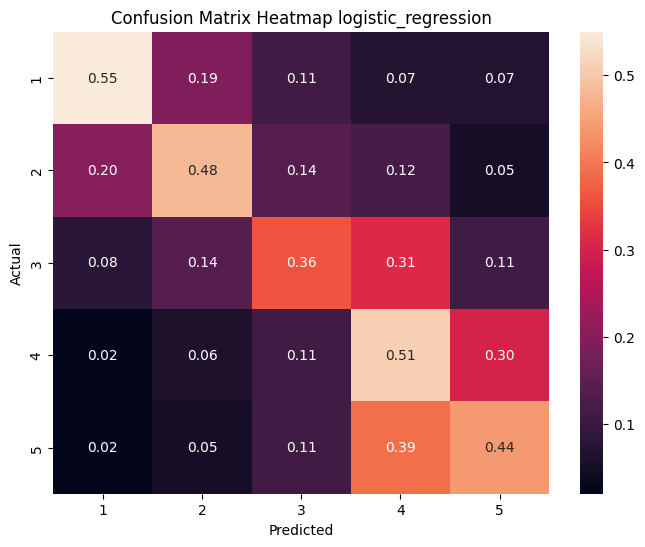

In [289]:
cm = confusion_matrix(y_train, y_train_pred)
actual = np.sum(cm, axis=1).reshape(-1, 1)
cmn = np.round(cm / actual, 2)

# Plot heatmap for train data
plt.figure(figsize=(8, 6))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=best_models[algo].classes_, yticklabels=best_models[algo].classes_)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix Heatmap {}'.format(algo))
plt.show()

In [277]:
y_test_pred = grid_search.predict(X_test)

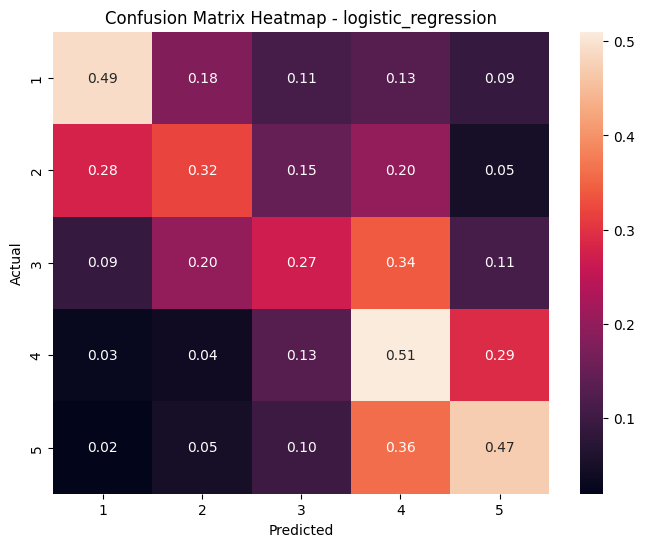

In [278]:
    cm = confusion_matrix(y_test, y_test_pred)
    actual = np.sum(cm, axis=1).reshape(-1, 1)
    cmn = np.round(cm / actual, 2)

    # Plot heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=best_models[algo].classes_, yticklabels=best_models[algo].classes_)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix Heatmap - {}'.format(algo))
    plt.show()

In [279]:
for name, model in best_models.items():
    print(f"{name}")
    print(f"{model}")
    print()

naive_bayes
Pipeline(memory=Memory(location=.cache/joblib),
         steps=[('vectorization', CountVectorizer(max_features=1000)),
                ('classifier', MultinomialNB(alpha=1))])

decision_tree
Pipeline(memory=Memory(location=.cache/joblib),
         steps=[('vectorization', CountVectorizer(max_features=1000)),
                ('classifier', DecisionTreeClassifier())])

logistic_regression
Pipeline(memory=Memory(location=.cache/joblib),
         steps=[('vectorization', CountVectorizer(max_features=1000)),
                ('classifier',
                 LogisticRegression(C=0.1, class_weight='balanced',
                                    l1_ratio=0.4, penalty='elasticnet',
                                    solver='saga'))])



In [280]:
best_model=grid_search.best_estimator_


In [281]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [282]:
model_path = '/content/drive/My Drive/demo_model_nb_unclean.pkl'
joblib.dump(best_model, model_path)

['/content/drive/My Drive/demo_model_nb_unclean.pkl']

In [283]:
model = joblib.load('/content/drive/My Drive/demo_model_nb_unclean.pkl')

In [302]:
new_data=["worst"]

In [303]:
new_data_clean = [clean(doc) for doc in new_data]


In [304]:
prediction = model.predict(new_data_clean)

print("Prediction:", prediction)

Prediction: [1]
